# ROOM FOR NEGOTIATION
### Finding Orientation in Real Estate Markets

We are about to test the Idea wether it is possible to construct an application that can estimate the adequacy of the price for a certain building under given circumstances. Real estate markets are evolving ever so quickly and it can be very helpful and assuring to be able to assess if a given price really is in the right vicinity (both for buyers and sellers). In order to do this, we will work with the King-County-Dataset, which has been slighty modified by our coaches with respect to varibale cleanliness. Our Goal is to check if it's possible to find certain features which are both relatively easy to evaluate by erveryday users and also of predicitve power. Since there should always be room for negotiation in real-estate-deals, a future application should also be able to give a reasonable price- _range_ for a given building.

<br/>

__At__ first we start with loading a couple of useful packages and cleaning our dataset. I leave this uncommented except for the data concerning renovations, which -- as I will try to demonstrate -- are of little informative value.

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats
import seaborn as sns
import statsmodels.api as sm
import statsmodels.formula.api as smf
import plotly.express as px
import sklearn as sk
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

from sklearn.linear_model import Ridge
from yellowbrick.datasets import load_concrete
from yellowbrick.regressor import ResidualsPlot

from pandas.plotting import scatter_matrix
pd.set_option('display.max_columns', None)

In [3]:
house_prices = pd.read_csv("King_County_House_prices_dataset.csv")

In [4]:
house_prices.shape

(21597, 21)

In [5]:
house_prices.head(10)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,3,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,3,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,3,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,5,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,3,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503
5,7237550310,5/12/2014,1230000.0,4,4.50,5420,101930,1.0,0.0,0.0,3,11,3890,1530.0,2001,0.0,98053,47.6561,-122.005,4760,101930
6,1321400060,6/27/2014,257500.0,3,2.25,1715,6819,2.0,0.0,0.0,3,7,1715,?,1995,0.0,98003,47.3097,-122.327,2238,6819
7,2008000270,1/15/2015,291850.0,3,1.50,1060,9711,1.0,0.0,NaN,3,7,1060,0.0,1963,0.0,98198,47.4095,-122.315,1650,9711
8,2414600126,4/15/2015,229500.0,3,1.00,1780,7470,1.0,0.0,0.0,3,7,1050,730.0,1960,0.0,98146,47.5123,-122.337,1780,8113
9,3793500160,3/12/2015,323000.0,3,2.50,1890,6560,2.0,0.0,0.0,3,7,1890,0.0,2003,0.0,98038,47.3684,-122.031,2390,7570


In [6]:
house_prices.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
id               21597 non-null int64
date             21597 non-null object
price            21597 non-null float64
bedrooms         21597 non-null int64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       19221 non-null float64
view             21534 non-null float64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21597 non-null object
yr_built         21597 non-null int64
yr_renovated     17755 non-null float64
zipcode          21597 non-null int64
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int64
dtypes: float64(8), int64(11), object(2)
memory usage: 3.5+ MB


In [7]:
house_prices.isnull().sum()

id                  0
date                0
price               0
bedrooms            0
bathrooms           0
sqft_living         0
sqft_lot            0
floors              0
waterfront       2376
view               63
condition           0
grade               0
sqft_above          0
sqft_basement       0
yr_built            0
yr_renovated     3842
zipcode             0
lat                 0
long                0
sqft_living15       0
sqft_lot15          0
dtype: int64

In [8]:
house_prices.sqft_basement.value_counts(dropna = False)

0.0       12826
?           454
600.0       217
500.0       209
700.0       208
800.0       201
400.0       184
1000.0      148
300.0       142
900.0       142
200.0       105
750.0       104
530.0       103
450.0       103
480.0       103
720.0        98
620.0        90
580.0        84
840.0        83
420.0        81
860.0        79
670.0        78
1100.0       78
780.0        76
550.0        76
650.0        75
240.0        74
680.0        73
380.0        73
850.0        72
          ...  
792.0         1
946.0         1
2250.0        1
283.0         1
2130.0        1
20.0          1
518.0         1
875.0         1
248.0         1
935.0         1
417.0         1
915.0         1
243.0         1
2600.0        1
225.0         1
862.0         1
506.0         1
1481.0        1
508.0         1
2360.0        1
2490.0        1
704.0         1
2350.0        1
768.0         1
1990.0        1
2730.0        1
2300.0        1
1798.0        1
861.0         1
176.0         1
Name: sqft_basement, Len

In [9]:
house_prices.sqft_basement = house_prices.sqft_basement.replace('?', np.nan)

In [10]:
house_prices.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
id               21597 non-null int64
date             21597 non-null object
price            21597 non-null float64
bedrooms         21597 non-null int64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       19221 non-null float64
view             21534 non-null float64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21143 non-null object
yr_built         21597 non-null int64
yr_renovated     17755 non-null float64
zipcode          21597 non-null int64
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int64
dtypes: float64(8), int64(11), object(2)
memory usage: 3.5+ MB


In [11]:
house_prices['sqft_basement'] = [float(sqft) for sqft in house_prices.sqft_basement]

In [12]:
house_prices.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
id               21597 non-null int64
date             21597 non-null object
price            21597 non-null float64
bedrooms         21597 non-null int64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       19221 non-null float64
view             21534 non-null float64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21143 non-null float64
yr_built         21597 non-null int64
yr_renovated     17755 non-null float64
zipcode          21597 non-null int64
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int64
dtypes: float64(9), int64(11), object(1)
memory usage: 3.5+ MB


In [13]:
house_prices.yr_renovated.value_counts(dropna = False)

 0.0       17011
NaN         3842
 2014.0       73
 2003.0       31
 2013.0       31
 2007.0       30
 2005.0       29
 2000.0       29
 1990.0       22
 2004.0       22
 2009.0       21
 1989.0       20
 2006.0       20
 2002.0       17
 1991.0       16
 1998.0       16
 1984.0       16
 1999.0       15
 2001.0       15
 2008.0       15
 2010.0       15
 1983.0       15
 2015.0       14
 1986.0       14
 1987.0       14
 1994.0       14
 1985.0       14
 1992.0       13
 1995.0       12
 1997.0       12
           ...  
 1964.0        5
 1975.0        5
 1973.0        4
 1981.0        4
 1963.0        4
 1969.0        4
 1965.0        4
 1972.0        3
 1956.0        3
 1945.0        3
 1960.0        3
 1978.0        3
 1958.0        3
 1955.0        3
 1974.0        2
 1962.0        2
 1967.0        2
 1940.0        2
 1957.0        2
 1946.0        1
 1959.0        1
 1951.0        1
 1954.0        1
 1950.0        1
 1971.0        1
 1944.0        1
 1948.0        1
 1976.0       

<br/>

__It's__ pretty weird that there should be 17.000 houses being sold without ever being renovated.


In [16]:
house_prices['date'] = [year[-4:] for year in house_prices.date]

In [17]:
house_prices['date'] = [int(year) for year in house_prices.date]

In [18]:
house_prices['age'] = house_prices['date'] - house_prices['yr_built']

In [19]:
house_prices.groupby('yr_renovated').age.mean()

yr_renovated
0.0        41.833167
1934.0     95.000000
1940.0     99.000000
1944.0    106.000000
1945.0    100.333333
1946.0    105.000000
1948.0    103.000000
1950.0    100.000000
1951.0     92.000000
1953.0     78.000000
1954.0     86.000000
1955.0    101.666667
1956.0     98.333333
1957.0     98.000000
1958.0     84.000000
1959.0     76.000000
1960.0     92.666667
1962.0     93.500000
1963.0     75.000000
1964.0     78.200000
1965.0    101.250000
1967.0     82.500000
1968.0     77.857143
1969.0     85.250000
1970.0     91.777778
1971.0    102.000000
1972.0     82.666667
1973.0     93.000000
1974.0     89.500000
1975.0     80.800000
             ...    
1986.0     76.928571
1987.0     81.000000
1988.0     80.545455
1989.0     72.400000
1990.0     70.954545
1991.0     72.437500
1992.0     74.307692
1993.0     85.000000
1994.0     86.642857
1995.0     72.083333
1996.0     82.272727
1997.0     68.583333
1998.0     59.187500
1999.0     69.266667
2000.0     68.137931
2001.0     65.733333


<br/>

__SO__ *sold* unrenovated Houses' mean would be at 38 years? Let's see how that looks in a Diagram:



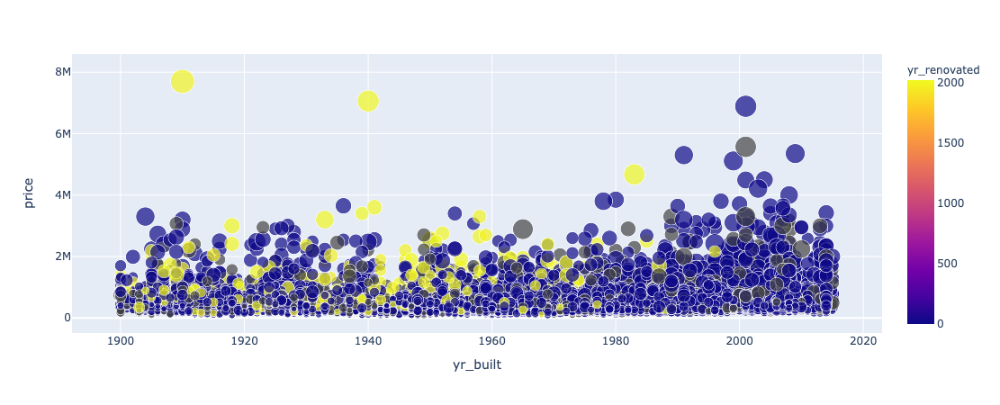

In [20]:
fig_scatter = px.scatter(house_prices, x = "yr_built", y = "price", color = "yr_renovated", 
                         size = "sqft_living")
fig_scatter.show()

<br/>

__WE__ therefore conclude that our model shouldn't rely on information concerning renovations (we also don't want to delete the zeros because that could also eradicate information on actual unrenovated buildings), although this would be a nice input for our application. We go on with more data cleaing!

<br/>

In [21]:
house_prices.waterfront.value_counts(dropna = False)

 0.0    19075
NaN      2376
 1.0      146
Name: waterfront, dtype: int64

In [22]:
house_prices.view.value_counts(dropna = False)

 0.0    19422
 2.0      957
 3.0      508
 1.0      330
 4.0      317
NaN        63
Name: view, dtype: int64

In [23]:
house_prices.waterfront.value_counts(dropna = False)


 0.0    19075
NaN      2376
 1.0      146
Name: waterfront, dtype: int64

In [24]:
house_prices = house_prices.dropna(subset=['waterfront'])

In [25]:
house_prices.isna().sum()
house_prices.waterfront.value_counts(dropna = False)

0.0    19075
1.0      146
Name: waterfront, dtype: int64

In [26]:
house_prices.date.value_counts()


2014    13030
2015     6191
Name: date, dtype: int64

In [27]:
house_prices.yr_built.value_counts(dropna=False)


2014    496
2006    404
2005    395
2007    372
2003    372
1977    370
2004    368
1978    347
1968    345
2008    330
1967    315
1959    307
1979    305
2001    278
1990    276
1962    272
1987    266
1954    265
1989    258
1969    248
1999    246
1988    244
1947    236
1955    233
1950    222
1994    221
1966    221
1998    218
1976    218
1980    217
       ... 
1930     83
1922     83
1906     83
1908     80
1923     79
1919     74
1900     74
1905     68
1911     68
1916     68
1912     68
1921     66
1937     64
1915     57
1913     57
1907     55
1931     54
1938     51
1917     47
1914     47
1904     42
1903     38
1936     37
1932     34
2015     33
1901     27
1933     26
1902     24
1935     22
1934     19
Name: yr_built, Length: 116, dtype: int64

In [28]:
house_prices['price_per_sqft'] = house_prices['price'] / house_prices['sqft_living']

<br/>

__SO__ let's make some dummies of _zipcode_ and _grade_, since they will contain useful information for our application: 

<br/>

In [29]:
house_prices_zip_dummies = pd.get_dummies(house_prices['zipcode'], prefix='zip')

In [30]:
house_prices_with_dummies = pd.concat([house_prices, house_prices_zip_dummies], axis = 1)

In [31]:
house_prices_with_dummies.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,age,price_per_sqft,zip_98001,zip_98002,zip_98003,zip_98004,zip_98005,zip_98006,zip_98007,zip_98008,zip_98010,zip_98011,zip_98014,zip_98019,zip_98022,zip_98023,zip_98024,zip_98027,zip_98028,zip_98029,zip_98030,zip_98031,zip_98032,zip_98033,zip_98034,zip_98038,zip_98039,zip_98040,zip_98042,zip_98045,zip_98052,zip_98053,zip_98055,zip_98056,zip_98058,zip_98059,zip_98065,zip_98070,zip_98072,zip_98074,zip_98075,zip_98077,zip_98092,zip_98102,zip_98103,zip_98105,zip_98106,zip_98107,zip_98108,zip_98109,zip_98112,zip_98115,zip_98116,zip_98117,zip_98118,zip_98119,zip_98122,zip_98125,zip_98126,zip_98133,zip_98136,zip_98144,zip_98146,zip_98148,zip_98155,zip_98166,zip_98168,zip_98177,zip_98178,zip_98188,zip_98198,zip_98199
1,6414100192,2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,3,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639,63,209.338521,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,5631500400,2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,3,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062,82,233.766234,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,2487200875,2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,5,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000,49,308.163265,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
4,1954400510,2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,3,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503,28,303.571429,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,7237550310,2014,1230000.0,4,4.50,5420,101930,1.0,0.0,0.0,3,11,3890,1530.0,2001,0.0,98053,47.6561,-122.005,4760,101930,13,226.937269,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [32]:
house_prices_with_dummies.drop('zip_98103', axis=1)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,age,price_per_sqft,zip_98001,zip_98002,zip_98003,zip_98004,zip_98005,zip_98006,zip_98007,zip_98008,zip_98010,zip_98011,zip_98014,zip_98019,zip_98022,zip_98023,zip_98024,zip_98027,zip_98028,zip_98029,zip_98030,zip_98031,zip_98032,zip_98033,zip_98034,zip_98038,zip_98039,zip_98040,zip_98042,zip_98045,zip_98052,zip_98053,zip_98055,zip_98056,zip_98058,zip_98059,zip_98065,zip_98070,zip_98072,zip_98074,zip_98075,zip_98077,zip_98092,zip_98102,zip_98105,zip_98106,zip_98107,zip_98108,zip_98109,zip_98112,zip_98115,zip_98116,zip_98117,zip_98118,zip_98119,zip_98122,zip_98125,zip_98126,zip_98133,zip_98136,zip_98144,zip_98146,zip_98148,zip_98155,zip_98166,zip_98168,zip_98177,zip_98178,zip_98188,zip_98198,zip_98199
1,6414100192,2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,3,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639,63,209.338521,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,5631500400,2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,3,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062,82,233.766234,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,2487200875,2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,5,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000,49,308.163265,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
4,1954400510,2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,3,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503,28,303.571429,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,7237550310,2014,1230000.0,4,4.50,5420,101930,1.0,0.0,0.0,3,11,3890,1530.0,2001,0.0,98053,47.6561,-122.005,4760,101930,13,226.937269,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,1321400060,2014,257500.0,3,2.25,1715,6819,2.0,0.0,0.0,3,7,1715,NaN,1995,0.0,98003,47.3097,-122.327,2238,6819,19,150.145773,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,2008000270,2015,291850.0,3,1.50,1060,9711,1.0,0.0,NaN,3,7,1060,0.0,1963,0.0,98198,47.4095,-122.315,1650,9711,52,275.330189,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
8,2414600126,2015,229500.0,3,1.00,1780,7470,1.0,0.0,0.0,3,7,1050,730.0,1960,0.0,98146,47.5123,-122.337,1780,8113,55,128.932584,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
9,3793500160,2015,323000.0,3,2.50,1890,6560,2.0,0.0,0.0,3,7,1890,0.0,2003,0.0,98038,47.3684,-122.031,2390,7570,12,170.899471,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
11,9212900260,2014,468000.0,2,1.00,1160,6000,1.0,0.0,0.0,4,7,860,300.0,1942,0.0,98115,47.6900,-122.292,1330,6000,72,403.448276,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [33]:
house_prices_grade_dummies = pd.get_dummies(house_prices['grade'], prefix= 'grade')

In [34]:
house_prices_with_dummies =  pd.concat([house_prices_with_dummies, house_prices_grade_dummies], axis = 1)

In [35]:
house_prices_with_dummies.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,age,price_per_sqft,zip_98001,zip_98002,zip_98003,zip_98004,zip_98005,zip_98006,zip_98007,zip_98008,zip_98010,zip_98011,zip_98014,zip_98019,zip_98022,zip_98023,zip_98024,zip_98027,zip_98028,zip_98029,zip_98030,zip_98031,zip_98032,zip_98033,zip_98034,zip_98038,zip_98039,zip_98040,zip_98042,zip_98045,zip_98052,zip_98053,zip_98055,zip_98056,zip_98058,zip_98059,zip_98065,zip_98070,zip_98072,zip_98074,zip_98075,zip_98077,zip_98092,zip_98102,zip_98103,zip_98105,zip_98106,zip_98107,zip_98108,zip_98109,zip_98112,zip_98115,zip_98116,zip_98117,zip_98118,zip_98119,zip_98122,zip_98125,zip_98126,zip_98133,zip_98136,zip_98144,zip_98146,zip_98148,zip_98155,zip_98166,zip_98168,zip_98177,zip_98178,zip_98188,zip_98198,zip_98199,grade_3,grade_4,grade_5,grade_6,grade_7,grade_8,grade_9,grade_10,grade_11,grade_12,grade_13
1,6414100192,2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,3,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639,63,209.338521,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
2,5631500400,2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,3,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062,82,233.766234,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
3,2487200875,2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,5,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000,49,308.163265,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
4,1954400510,2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,3,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503,28,303.571429,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
5,7237550310,2014,1230000.0,4,4.50,5420,101930,1.0,0.0,0.0,3,11,3890,1530.0,2001,0.0,98053,47.6561,-122.005,4760,101930,13,226.937269,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0


In [36]:
house_prices_with_dummies.grade.value_counts()

7     7974
8     5409
9     2320
6     1810
10    1018
11     357
5      212
12      82
4       25
13      13
3        1
Name: grade, dtype: int64

In [37]:
house_prices_with_dummies.drop('grade_7',axis=1 )

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,age,price_per_sqft,zip_98001,zip_98002,zip_98003,zip_98004,zip_98005,zip_98006,zip_98007,zip_98008,zip_98010,zip_98011,zip_98014,zip_98019,zip_98022,zip_98023,zip_98024,zip_98027,zip_98028,zip_98029,zip_98030,zip_98031,zip_98032,zip_98033,zip_98034,zip_98038,zip_98039,zip_98040,zip_98042,zip_98045,zip_98052,zip_98053,zip_98055,zip_98056,zip_98058,zip_98059,zip_98065,zip_98070,zip_98072,zip_98074,zip_98075,zip_98077,zip_98092,zip_98102,zip_98103,zip_98105,zip_98106,zip_98107,zip_98108,zip_98109,zip_98112,zip_98115,zip_98116,zip_98117,zip_98118,zip_98119,zip_98122,zip_98125,zip_98126,zip_98133,zip_98136,zip_98144,zip_98146,zip_98148,zip_98155,zip_98166,zip_98168,zip_98177,zip_98178,zip_98188,zip_98198,zip_98199,grade_3,grade_4,grade_5,grade_6,grade_8,grade_9,grade_10,grade_11,grade_12,grade_13
1,6414100192,2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,3,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639,63,209.338521,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,5631500400,2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,3,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062,82,233.766234,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
3,2487200875,2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,5,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000,49,308.163265,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,1954400510,2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,3,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503,28,303.571429,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
5,7237550310,2014,1230000.0,4,4.50,5420,101930,1.0,0.0,0.0,3,11,3890,1530.0,2001,0.0,98053,47.6561,-122.005,4760,101930,13,226.937269,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
6,1321400060,2014,257500.0,3,2.25,1715,6819,2.0,0.0,0.0,3,7,1715,NaN,1995,0.0,98003,47.3097,-122.327,2238,6819,19,150.145773,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,2008000270,2015,291850.0,3,1.50,1060,9711,1.0,0.0,NaN,3,7,1060,0.0,1963,0.0,98198,47.4095,-122.315,1650,9711,52,275.330189,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
8,2414600126,2015,229500.0,3,1.00,1780,7470,1.0,0.0,0.0,3,7,1050,730.0,1960,0.0,98146,47.5123,-122.337,1780,8113,55,128.932584,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,3793500160,2015,323000.0,3,2.50,1890,6560,2.0,0.0,0.0,3,7,1890,0.0,2003,0.0,98038,47.3684,-122.031,2390,7570,12,170.899471,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
11,9212900260,2014,468000.0,2,1.00,1160,6000,1.0,0.0,0.0,4,7,860,300.0,1942,0.0,98115,47.6900,-122.292,1330,6000,72,403.448276,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


<br/>

__ALRIGHT__, let's split our dataset into test and training data, holding 20% back for validation purposes:

<br/>

In [38]:
train, test = train_test_split(house_prices_with_dummies, test_size=0.2, random_state=420, shuffle=True)

In [39]:
print(train.shape)
print(test.shape)

(15376, 104)
(3845, 104)


In [40]:
train.describe()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,age,price_per_sqft,zip_98001,zip_98002,zip_98003,zip_98004,zip_98005,zip_98006,zip_98007,zip_98008,zip_98010,zip_98011,zip_98014,zip_98019,zip_98022,zip_98023,zip_98024,zip_98027,zip_98028,zip_98029,zip_98030,zip_98031,zip_98032,zip_98033,zip_98034,zip_98038,zip_98039,zip_98040,zip_98042,zip_98045,zip_98052,zip_98053,zip_98055,zip_98056,zip_98058,zip_98059,zip_98065,zip_98070,zip_98072,zip_98074,zip_98075,zip_98077,zip_98092,zip_98102,zip_98103,zip_98105,zip_98106,zip_98107,zip_98108,zip_98109,zip_98112,zip_98115,zip_98116,zip_98117,zip_98118,zip_98119,zip_98122,zip_98125,zip_98126,zip_98133,zip_98136,zip_98144,zip_98146,zip_98148,zip_98155,zip_98166,zip_98168,zip_98177,zip_98178,zip_98188,zip_98198,zip_98199,grade_3,grade_4,grade_5,grade_6,grade_7,grade_8,grade_9,grade_10,grade_11,grade_12,grade_13
count,1.537600e+04,15376.000000,1.537600e+04,15376.000000,15376.000000,15376.000000,1.537600e+04,15376.000000,15376.000000,15330.000000,15376.000000,15376.000000,15376.000000,15030.000000,15376.000000,12649.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000,15376.000000
mean,4.584357e+09,2014.324532,5.437405e+05,3.379553,2.121667,2090.248374,1.512322e+04,1.497789,0.007219,0.233203,3.408299,7.666493,1799.546371,290.843912,1971.183858,82.355364,98077.791363,47.560008,-122.213730,1992.205645,12997.103928,43.140674,264.438719,0.016649,0.009105,0.013267,0.014828,0.008195,0.022828,0.006634,0.013332,0.004618,0.008780,0.005723,0.008520,0.010926,0.023088,0.004097,0.019771,0.013202,0.014828,0.011967,0.013007,0.006309,0.019641,0.025819,0.028031,0.002211,0.013332,0.025234,0.010081,0.026665,0.018730,0.011446,0.019186,0.019771,0.021072,0.014438,0.005138,0.012097,0.020552,0.016519,0.009365,0.016324,0.004683,0.027966,0.010991,0.015219,0.012162,0.008585,0.005528,0.013007,0.026015,0.015544,0.025689,0.023023,0.008585,0.013332,0.019641,0.016389,0.021852,0.012032,0.016259,0.013137,0.002601,0.019771,0.010991,0.012812,0.012487,0.012227,0.006439,0.012487,0.015219,0.000065,0.001366,0.010601,0.093978,0.413632,0.281152,0.122334,0.053005,0.018861,0.004292,0.000715
std,2.880357e+09,0.468215,3.749321e+05,0.935755,0.773986,931.702508,4.081720e+04,0.540606,0.084660,0.765869,0.647833,1.178114,840.559820,443.358249,29.378713,396.976544,53.591297,0.138438,0.140975,688.932667,28580.932723,29.381559,110.506418,0.127958,0.094988,0.114421,0.120869,0.090155,0.149359,0.081180,0.114698,0.067798,0.093292,0.075438,0.091912,0.103959,0.150188,0.063881,0.139217,0.114144,0.120869,0.108739,0.113309,0.079178,0.138768,0.158602,0.165066,0.046973,0.114698,0.156841,0.099898,0.161107,0.135576,0.106377,0.137182,0.139217,0.143628,0.119292,0.071497,0.109322,0.141882,0.127465,0.096323,0.126723,0.068272,0.164880,0.104264,0.122425,0.109612,0.0922

<br/>

__OKAY__, so let's do some Visualizations already!


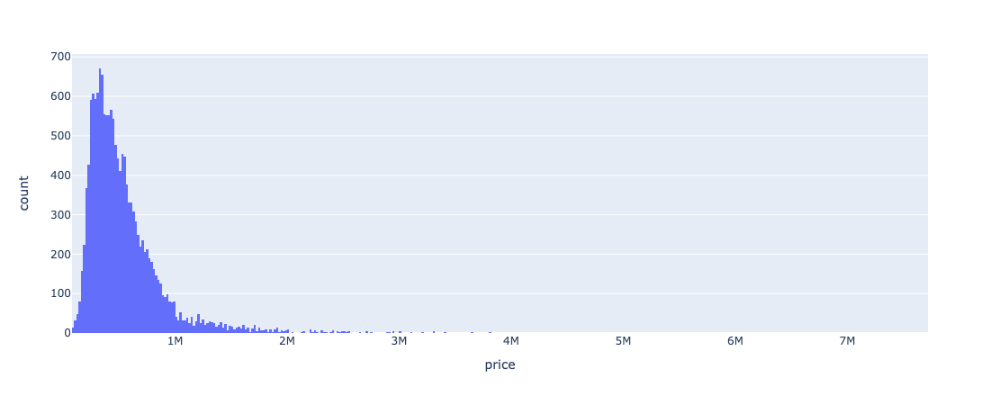

In [41]:
train_prices_hist = px.histogram(train, x = "price")
                         
train_prices_hist.show()

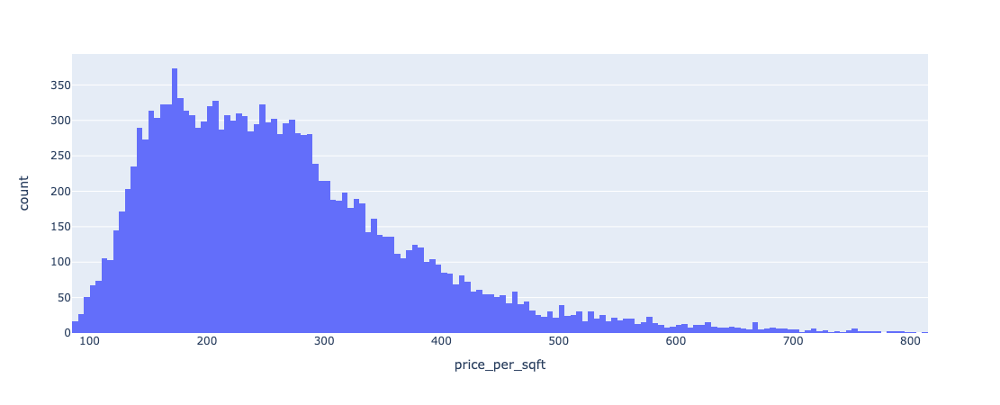

In [42]:
train_prices_per_sqft_hist = px.histogram(train, x = "price_per_sqft",)
                         
train_prices_per_sqft_hist.show()

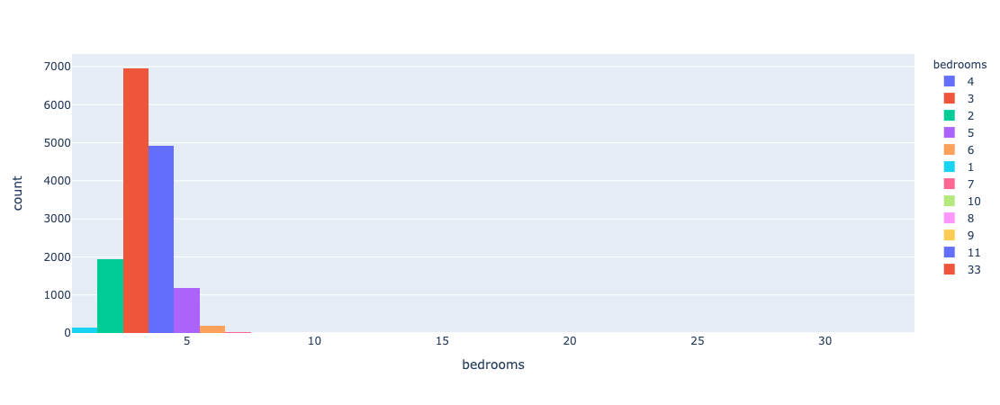

In [43]:
train_prices_bedrooms_hist = px.histogram(train, x = "bedrooms", color = 'bedrooms')
train_prices_bedrooms_hist.show()

In [44]:
median_ppsqft = train.groupby('bedrooms', as_index = False).price_per_sqft.median()


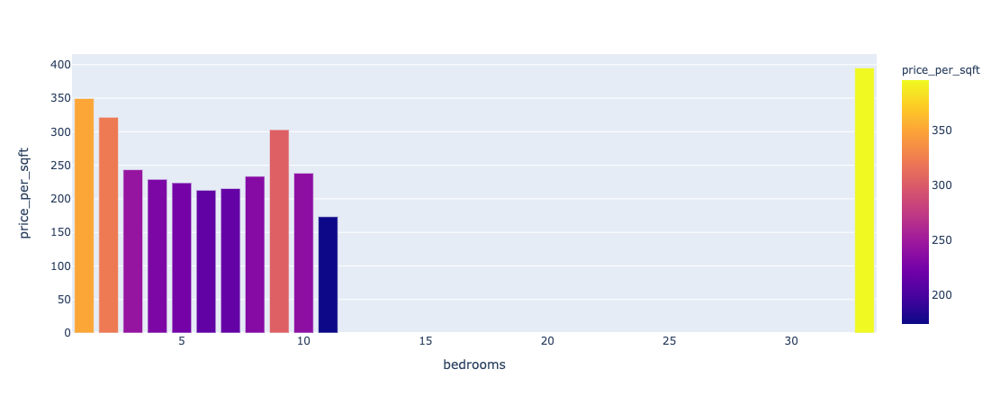

In [45]:
train_prices_hist = px.bar(median_ppsqft, x = "bedrooms", y= 'price_per_sqft', color = 'price_per_sqft')
                         
train_prices_hist.show()

In [46]:
median_price = train.groupby('bedrooms', as_index = False).price.median()

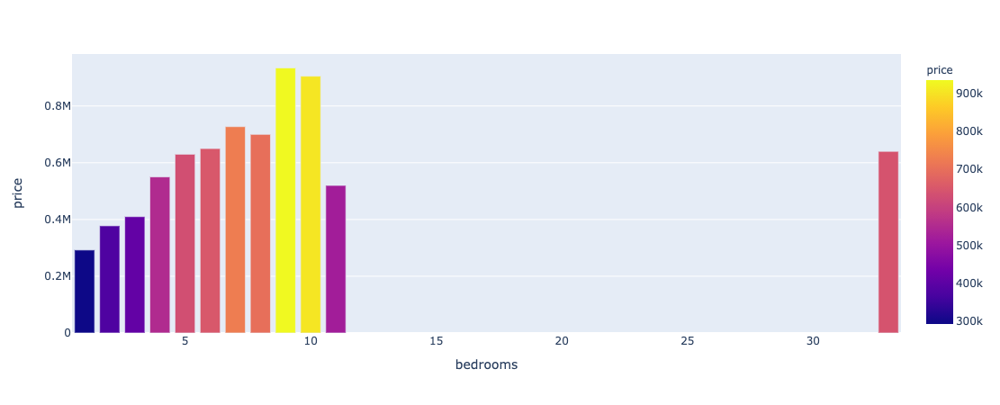

In [47]:
train_prices_bar = px.bar(median_price, x = "bedrooms", y= 'price', color = 'price')
                         
train_prices_bar.show()

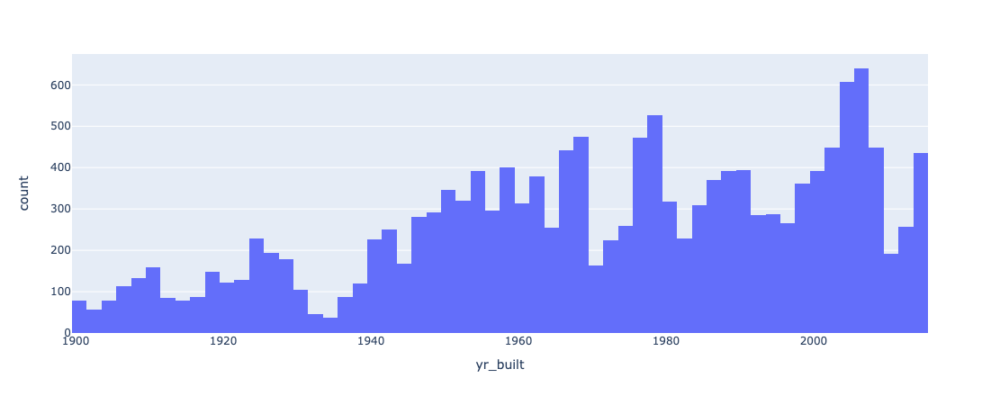

In [48]:
train_prices_yr_built_hist = px.histogram(train, x = "yr_built")
train_prices_yr_built_hist.show()

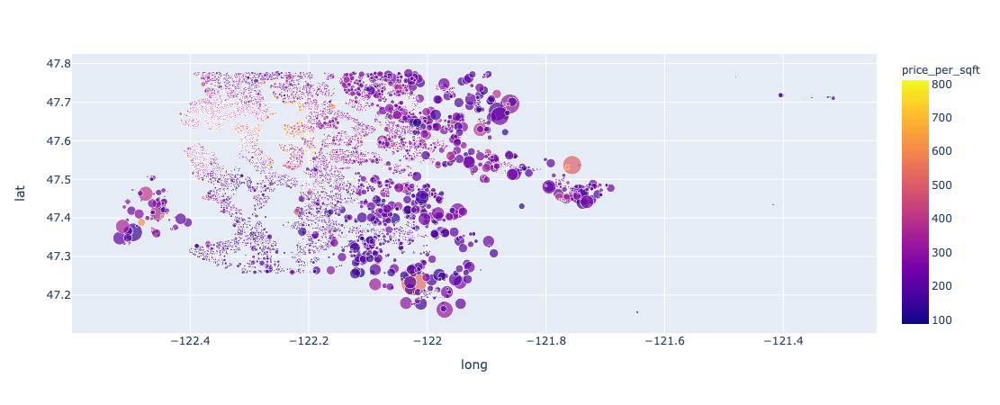

In [49]:
train_scatter_2 = px.scatter(train, x = "long", y = "lat", color = "price_per_sqft", 
                         size = "sqft_lot", hover_data = ["age"])
train_scatter_2.show()

<br/>

__MAPPING__ longitude vs latitude with price per sqft and lotsize gives us a nice map of King County. We can see the rural areas with large properties, the expensive cities and even some water and Islands!
<br/>

<br/>

__NOW__ let's take a look at potential _and_ reasonable predictors for house-prices. Since today our primary goal is prediction, we don't have to care about multicolinearity too much.

<br/>

In [50]:
predictors = list(train.columns)
predictors= [e for e in predictors 
                        if e not in ('price','id', 'zipcode', 'lat', 'long', 'yr_built', 'yr_renovated', 'date', 'view', )]
predictors

['bedrooms',
 'bathrooms',
 'sqft_living',
 'sqft_lot',
 'floors',
 'waterfront',
 'condition',
 'grade',
 'sqft_above',
 'sqft_basement',
 'sqft_living15',
 'sqft_lot15',
 'age',
 'price_per_sqft',
 'zip_98001',
 'zip_98002',
 'zip_98003',
 'zip_98004',
 'zip_98005',
 'zip_98006',
 'zip_98007',
 'zip_98008',
 'zip_98010',
 'zip_98011',
 'zip_98014',
 'zip_98019',
 'zip_98022',
 'zip_98023',
 'zip_98024',
 'zip_98027',
 'zip_98028',
 'zip_98029',
 'zip_98030',
 'zip_98031',
 'zip_98032',
 'zip_98033',
 'zip_98034',
 'zip_98038',
 'zip_98039',
 'zip_98040',
 'zip_98042',
 'zip_98045',
 'zip_98052',
 'zip_98053',
 'zip_98055',
 'zip_98056',
 'zip_98058',
 'zip_98059',
 'zip_98065',
 'zip_98070',
 'zip_98072',
 'zip_98074',
 'zip_98075',
 'zip_98077',
 'zip_98092',
 'zip_98102',
 'zip_98103',
 'zip_98105',
 'zip_98106',
 'zip_98107',
 'zip_98108',
 'zip_98109',
 'zip_98112',
 'zip_98115',
 'zip_98116',
 'zip_98117',
 'zip_98118',
 'zip_98119',
 'zip_98122',
 'zip_98125',
 'zip_98126',
 'z

In [51]:
print('R squared for each possible explanatory variable:' )
for predictor in predictors:
    model = 'price ~ {:}'.format(predictor)
    rs = smf.ols(formula=model, data=train).fit().rsquared
    print('{:7s} \t \t= {:.3}'.format(predictor, rs))

R squared for each possible explanatory variable:
bedrooms 	 	= 0.0954
bathrooms 	 	= 0.279
sqft_living 	 	= 0.499
sqft_lot 	 	= 0.00831
floors  	 	= 0.0679
waterfront 	 	= 0.0796
condition 	 	= 0.00152
grade   	 	= 0.445
sqft_above 	 	= 0.378
sqft_basement 	 	= 0.102
sqft_living15 	 	= 0.34
sqft_lot15 	 	= 0.00679
age     	 	= 0.00256
price_per_sqft 	 	= 0.305
zip_98001 	 	= 0.00842
zip_98002 	 	= 0.00627
zip_98003 	 	= 0.00616
zip_98004 	 	= 0.069
zip_98005 	 	= 0.00392
zip_98006 	 	= 0.0194
zip_98007 	 	= 0.000313
zip_98008 	 	= 0.00163
zip_98010 	 	= 0.000392
zip_98011 	 	= 0.000161
zip_98014 	 	= 0.000184
zip_98019 	 	= 0.000782
zip_98022 	 	= 0.00386
zip_98023 	 	= 0.0112
zip_98024 	 	= 2.41e-05
zip_98027 	 	= 0.000548
zip_98028 	 	= 0.000575
zip_98029 	 	= 0.000347
zip_98030 	 	= 0.00512
zip_98031 	 	= 0.0056
zip_98032 	 	= 0.00396
zip_98033 	 	= 0.00908
zip_98034 	 	= 4.24e-05
zip_98038 	 	= 0.00636
zip_98039 	 	= 0.0373
zip_98040 	 	= 0.0453
zip_98042 	 	= 0.0101
zip_98045 	 	

__IF__ we were interested in the influence of single variables on price, we would have to check for multicollinearity in our independet Variables and could use the follwing correlation-matrix. Since our regression-model will be primarily aimed at predicitve power though, we can just skip this huge table ;)

In [52]:
explanatory_vars_df = train[['bedrooms',
 'bathrooms',
 'sqft_living',
 'sqft_lot',
 'floors',
 'waterfront',
 'condition',
 'grade',
 'sqft_above',
 'sqft_basement',
 'sqft_living15',
 'sqft_lot15',
 'age',
 'price_per_sqft',
 ]].copy()



<br/>

__LET'S__ have a first look at the relationship of some assumably good predictors. As you can already see, also grade (color) and number of bathrooms (size) fit into the picture:

<br/>

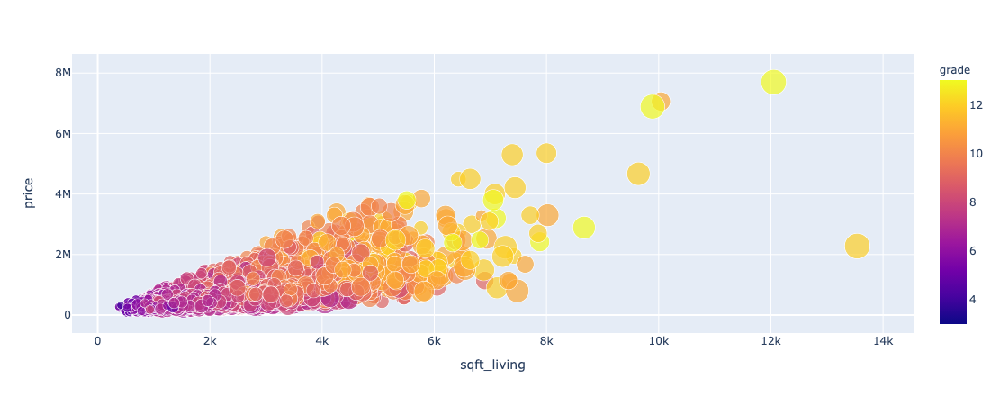

In [53]:
train_scatter_1 = px.scatter(train, x = "sqft_living", y = "price", color = "grade", 
                         size = "bathrooms", hover_data = ["age"])
train_scatter_1.show()

__LET'S__ dive a bit mor into this by plotting a scatter matrix:

/opt/anaconda3/envs/nf/lib/python3.6/site-packages/pandas/plotting/_tools.py:307: MatplotlibDeprecationWarning:


The rowNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().rowspan.start instead.

/opt/anaconda3/envs/nf/lib/python3.6/site-packages/pandas/plotting/_tools.py:307: MatplotlibDeprecationWarning:


The colNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().colspan.start instead.

/opt/anaconda3/envs/nf/lib/python3.6/site-packages/pandas/plotting/_tools.py:313: MatplotlibDeprecationWarning:


The rowNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().rowspan.start instead.

/opt/anaconda3/envs/nf/lib/python3.6/site-packages/pandas/plotting/_tools.py:313: MatplotlibDeprecationWarning:


The colNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases late

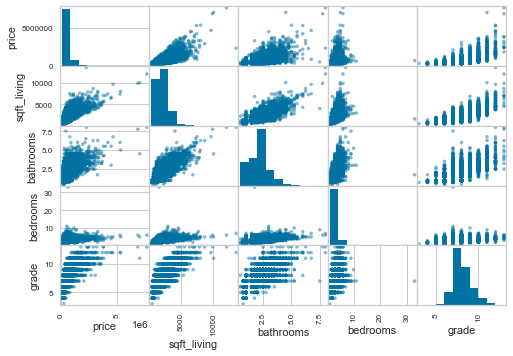

In [54]:
scatter_matrix(train[["price", "sqft_living", "bathrooms", "bedrooms", "grade"]]);

<br/>

__WHAT__ we can also see is that the larger our houses get, the worse our estimate will be! Let's inquire into this by explicitly constructing a regression model with sklearn and also plotting the residuals (also for our test-data):

<br/>

__MODEL 1__

In [55]:
x_train = train.sqft_living.values.reshape(-1, 1) 
y_train = train['price']
y_test = test['price']
x_test = test.sqft_living.values.reshape(-1, 1)
linear_regressor = LinearRegression()  
linear_regressor.fit(x_train, y_train) 
y_pred = linear_regressor.predict(x_test) 
y_pred

array([ 594821.15345971,  270863.43782204,  404424.95216389, ...,
        572087.27867812,  438525.76433628, 1103491.60169781])

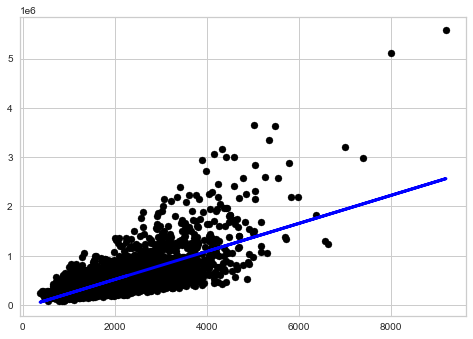

In [56]:
x_train = train.sqft_living.values.reshape(-1, 1) 
y_train = train['price']
x_test = test.sqft_living.values.reshape(-1, 1)
y_test = test['price']

linear_regressor = LinearRegression()  
linear_regressor.fit(x_train, y_train)  

plt.scatter(x_test, y_test,  color='black')
plt.plot(x_test, y_pred, color='blue', linewidth=3)




/opt/anaconda3/envs/nf/lib/python3.6/site-packages/sklearn/base.py:213: FutureWarning:

From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.



<bound method Visualizer.show of ResidualsPlot(ax=<AxesSubplot:>, line_color=None, model=None, test_alpha=None,
              test_color=None, train_alpha=None, train_color=None)>

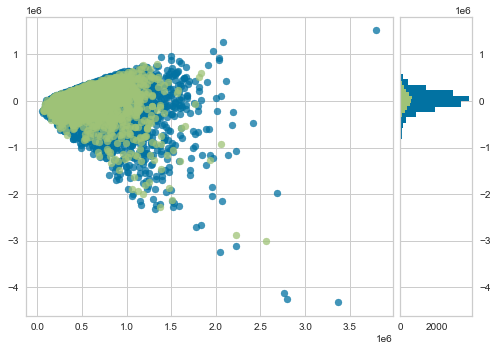

In [58]:
model = sk.linear_model.LinearRegression()
visualizer = ResidualsPlot(model)
visualizer.fit(x_train, y_train)
visualizer.score(x_test, y_test)
visualizer.show

<br/>

__Also__, we want to get the _Mean Absolute Percentage Error_, hence:

<br/>

In [59]:
def mape(actual, pred): 
    actual, pred = np.array(actual), np.array(pred)
    return np.mean(np.abs((actual - pred) / actual)) * 100

In [60]:
mape(y_test, y_pred)

35.485235679799224

<br/>

__NOW__ let's see wether we can catch our straying residuals if we construct more complicated regression models:

<br/>

__MODEL 2__

In [61]:
x2_train = train[['sqft_living', 'sqft_lot' ]]
y2_train = train['price']
y2_test = test['price']
x2_test = test[['sqft_living', 'sqft_lot']]
linear_regressor = LinearRegression()  
linear_regressor.fit(x2_train, y2_train) 
y2_pred = linear_regressor.predict(x2_test) 
mape(y2_test, y2_pred)

35.65423229368647

/opt/anaconda3/envs/nf/lib/python3.6/site-packages/sklearn/base.py:213: FutureWarning:

From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.



<bound method Visualizer.show of ResidualsPlot(ax=<AxesSubplot:>, line_color=None, model=None, test_alpha=None,
              test_color=None, train_alpha=None, train_color=None)>

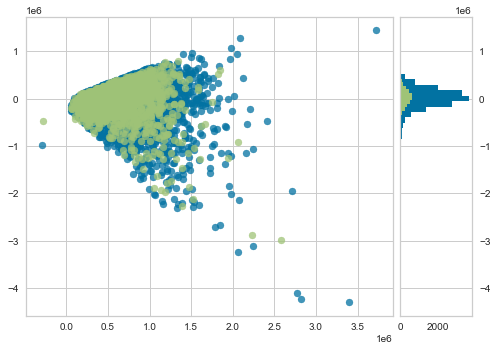

In [62]:
model2 = sk.linear_model.LinearRegression()
visualizer = ResidualsPlot(model2)
visualizer.fit(x2_train, y2_train)
visualizer.score(x2_test, y2_test)
visualizer.show

__MODEL3__

In [63]:
x3_train = train[['sqft_living', 'sqft_lot', 'bathrooms']]
y3_train = train['price']
x3_test = test[['sqft_living', 'sqft_lot', 'bathrooms']]
y3_test = test['price']

linear_regressor = LinearRegression()  
linear_regressor.fit(x3_train, y3_train) 
y3_pred = linear_regressor.predict(x3_test) 
mape(y3_test, y3_pred)

35.67438920339847

/opt/anaconda3/envs/nf/lib/python3.6/site-packages/sklearn/base.py:213: FutureWarning:

From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.



<bound method Visualizer.show of ResidualsPlot(ax=<AxesSubplot:>, line_color=None, model=None, test_alpha=None,
              test_color=None, train_alpha=None, train_color=None)>

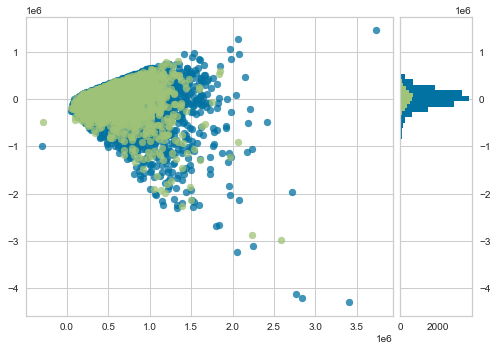

In [64]:
model3 = sk.linear_model.LinearRegression()
visualizer = ResidualsPlot(model3)
visualizer.fit(x3_train, y3_train)
visualizer.score(x3_test, y3_test)
visualizer.show

<br/>

__WE__ don't really get rid of our straying residuals and the Mean Absolute Percentage Error is decreasing rather slowly, so let's speed things up and use more predictors, which can be brought in Line with our Business Case, i.e they can be evaluated by our users!  

<br/>

__MODEL4__

In [65]:
x4_train = train[['sqft_living', 'bathrooms', 'floors', 'bedrooms', 'age', 'waterfront', 'zip_98001', 'zip_98002', 'zip_98003', 'zip_98004', 'zip_98005', 'zip_98006', 'zip_98007', 'zip_98008', 'zip_98010', 'zip_98011', 'zip_98014', 'zip_98019', 'zip_98022', 'zip_98023', 'zip_98024', 'zip_98027', 'zip_98028', 'zip_98029', 'zip_98030', 'zip_98031', 'zip_98032', 'zip_98033', 'zip_98034', 'zip_98038', 'zip_98039', 'zip_98040', 'zip_98042', 'zip_98045', 'zip_98052', 'zip_98053', 'zip_98055', 'zip_98056', 'zip_98058', 'zip_98059', 'zip_98065', 'zip_98070', 'zip_98072', 'zip_98074', 'zip_98075', 'zip_98077', 'zip_98092', 'zip_98102', 'zip_98103', 'zip_98105', 'zip_98106', 'zip_98107', 'zip_98108', 'zip_98109', 'zip_98112', 'zip_98115', 'zip_98116', 'zip_98117', 'zip_98118', 'zip_98119', 'zip_98122', 'zip_98125', 'zip_98126', 'zip_98133', 'zip_98136', 'zip_98144', 'zip_98146', 'zip_98148', 'zip_98155', 'zip_98166', 'zip_98168', 'zip_98177', 'zip_98178', 'zip_98188', 'zip_98198', 'zip_98199', 'grade_3', 'grade_4', 'grade_5', 'grade_6', 'grade_7', 'grade_8', 'grade_9', 'grade_10', 'grade_11', 'grade_12', 'grade_13' ]]
y4_train = train['price']
x4_test = test[['sqft_living', 'bathrooms', 'floors', 'bedrooms', 'age', 'waterfront', 'zip_98001', 'zip_98002', 'zip_98003', 'zip_98004', 'zip_98005', 'zip_98006', 'zip_98007', 'zip_98008', 'zip_98010', 'zip_98011', 'zip_98014', 'zip_98019', 'zip_98022', 'zip_98023', 'zip_98024', 'zip_98027', 'zip_98028', 'zip_98029', 'zip_98030', 'zip_98031', 'zip_98032', 'zip_98033', 'zip_98034', 'zip_98038', 'zip_98039', 'zip_98040', 'zip_98042', 'zip_98045', 'zip_98052', 'zip_98053', 'zip_98055', 'zip_98056', 'zip_98058', 'zip_98059', 'zip_98065', 'zip_98070', 'zip_98072', 'zip_98074', 'zip_98075', 'zip_98077', 'zip_98092', 'zip_98102', 'zip_98103', 'zip_98105', 'zip_98106', 'zip_98107', 'zip_98108', 'zip_98109', 'zip_98112', 'zip_98115', 'zip_98116', 'zip_98117', 'zip_98118', 'zip_98119', 'zip_98122', 'zip_98125', 'zip_98126', 'zip_98133', 'zip_98136', 'zip_98144', 'zip_98146', 'zip_98148', 'zip_98155', 'zip_98166', 'zip_98168', 'zip_98177', 'zip_98178', 'zip_98188', 'zip_98198', 'zip_98199', 'grade_3', 'grade_4', 'grade_5', 'grade_6', 'grade_7', 'grade_8', 'grade_9', 'grade_10', 'grade_11', 'grade_12', 'grade_13' ]]
y4_test = test['price']

linear_regressor = LinearRegression()  
linear_regressor.fit(x4_train, y4_train) 
y4_pred = linear_regressor.predict(x4_test) 
mape(y4_test, y4_pred)

18.200469231640923

/opt/anaconda3/envs/nf/lib/python3.6/site-packages/sklearn/base.py:213: FutureWarning:

From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.



<bound method Visualizer.show of ResidualsPlot(ax=<AxesSubplot:>, line_color=None, model=None, test_alpha=None,
              test_color=None, train_alpha=None, train_color=None)>

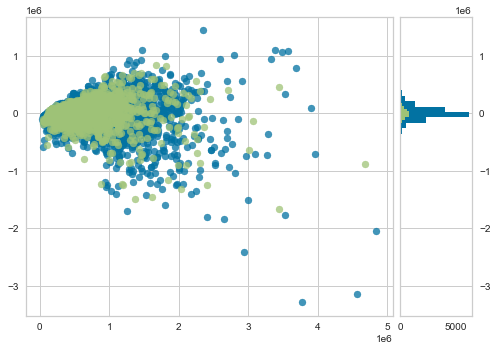

In [66]:
model4 = sk.linear_model.LinearRegression()
visualizer = ResidualsPlot(model4)
visualizer.fit(x4_train, y4_train)
visualizer.score(x4_test, y4_test)
visualizer.show

<br/>

__So__ our MAPE of 18.2% is not that bad, but we still have a problem with our model's rediuals becoming too loose! Let's think about our business case again: we want to design an application, that gives people the possibility to assess wether a certain price for a building that they wish to acquire (or to sell) is _passably adeqaute_. Let's have a look at the overview again:


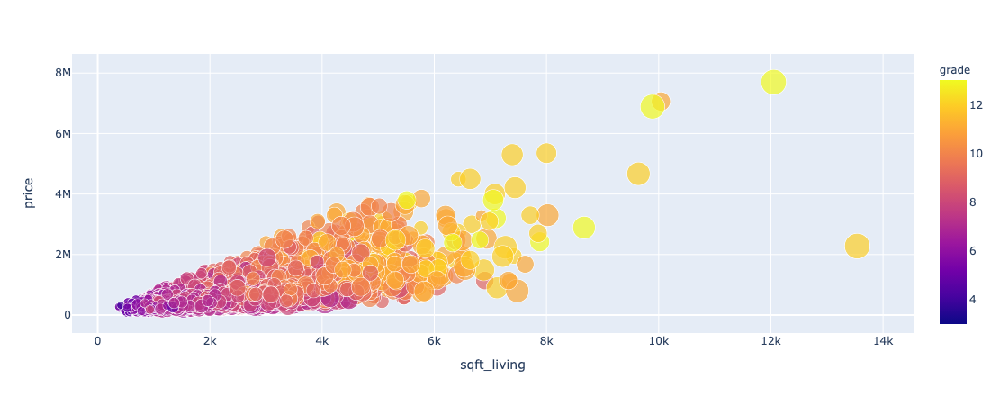

In [67]:
train_scatter_1 = px.scatter(train, x = "sqft_living", y = "price", color = "grade", 
                         size = "bathrooms", hover_data = ["age"])
train_scatter_1.show()

__What__ if we said, we only wanted to give recommemndations and room for negotiation for houses that are below 4000sqft? It should be pretty okay (and even adequate), if our model shys away from predicting prices for extremely huge (and presumanbly extravagant) houses! So let's just cap our model at 4000sqft and make that boundary explicit in our application afterwards!

<br/>

__MODEL 5__

In [68]:
train_businesscase = train[(train['sqft_living'] <= 4000 )]

In [69]:
test_businesscase = test[(test['sqft_living'] <= 4000 )]

In [70]:
x5_train = train_businesscase[['sqft_living', 'bathrooms', 'floors', 'bedrooms', 'age', 'waterfront', 'zip_98001', 'zip_98002', 'zip_98003', 'zip_98004', 'zip_98005', 'zip_98006', 'zip_98007', 'zip_98008', 'zip_98010', 'zip_98011', 'zip_98014', 'zip_98019', 'zip_98022', 'zip_98023', 'zip_98024', 'zip_98027', 'zip_98028', 'zip_98029', 'zip_98030', 'zip_98031', 'zip_98032', 'zip_98033', 'zip_98034', 'zip_98038', 'zip_98039', 'zip_98040', 'zip_98042', 'zip_98045', 'zip_98052', 'zip_98053', 'zip_98055', 'zip_98056', 'zip_98058', 'zip_98059', 'zip_98065', 'zip_98070', 'zip_98072', 'zip_98074', 'zip_98075', 'zip_98077', 'zip_98092', 'zip_98102', 'zip_98103', 'zip_98105', 'zip_98106', 'zip_98107', 'zip_98108', 'zip_98109', 'zip_98112', 'zip_98115', 'zip_98116', 'zip_98117', 'zip_98118', 'zip_98119', 'zip_98122', 'zip_98125', 'zip_98126', 'zip_98133', 'zip_98136', 'zip_98144', 'zip_98146', 'zip_98148', 'zip_98155', 'zip_98166', 'zip_98168', 'zip_98177', 'zip_98178', 'zip_98188', 'zip_98198', 'zip_98199', 'grade_3', 'grade_4', 'grade_5', 'grade_6', 'grade_7', 'grade_8', 'grade_9', 'grade_10', 'grade_11', 'grade_12', 'grade_13' ]]
y5_train = train_businesscase['price']
x5_test = test_businesscase[['sqft_living', 'bathrooms', 'floors', 'bedrooms', 'age', 'waterfront', 'zip_98001', 'zip_98002', 'zip_98003', 'zip_98004', 'zip_98005', 'zip_98006', 'zip_98007', 'zip_98008', 'zip_98010', 'zip_98011', 'zip_98014', 'zip_98019', 'zip_98022', 'zip_98023', 'zip_98024', 'zip_98027', 'zip_98028', 'zip_98029', 'zip_98030', 'zip_98031', 'zip_98032', 'zip_98033', 'zip_98034', 'zip_98038', 'zip_98039', 'zip_98040', 'zip_98042', 'zip_98045', 'zip_98052', 'zip_98053', 'zip_98055', 'zip_98056', 'zip_98058', 'zip_98059', 'zip_98065', 'zip_98070', 'zip_98072', 'zip_98074', 'zip_98075', 'zip_98077', 'zip_98092', 'zip_98102', 'zip_98103', 'zip_98105', 'zip_98106', 'zip_98107', 'zip_98108', 'zip_98109', 'zip_98112', 'zip_98115', 'zip_98116', 'zip_98117', 'zip_98118', 'zip_98119', 'zip_98122', 'zip_98125', 'zip_98126', 'zip_98133', 'zip_98136', 'zip_98144', 'zip_98146', 'zip_98148', 'zip_98155', 'zip_98166', 'zip_98168', 'zip_98177', 'zip_98178', 'zip_98188', 'zip_98198', 'zip_98199', 'grade_3', 'grade_4', 'grade_5', 'grade_6', 'grade_7', 'grade_8', 'grade_9', 'grade_10', 'grade_11', 'grade_12', 'grade_13' ]]
y5_test = test_businesscase['price']

linear_regressor = LinearRegression()  
linear_regressor.fit(x5_train, y5_train) 
y5_pred = linear_regressor.predict(x5_test) 
mape(y5_test, y5_pred)

16.791273131193986

/opt/anaconda3/envs/nf/lib/python3.6/site-packages/sklearn/base.py:213: FutureWarning:

From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.



<bound method Visualizer.show of ResidualsPlot(ax=<AxesSubplot:>, line_color=None, model=None, test_alpha=None,
              test_color=None, train_alpha=None, train_color=None)>

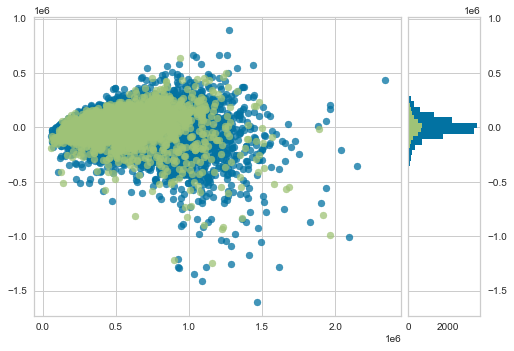

In [71]:
model5 = sk.linear_model.LinearRegression()
visualizer = ResidualsPlot(model5)
visualizer.fit(x5_train, y5_train)
visualizer.score(x5_test, y5_test)
visualizer.show

__SO__ this one still shows the same tendency as seen before -- which could mean that houseprices just get harder to predict the bigger and nicer houses get _or_ that we don't know all the relevant features yet -- but given that the king county dataset is only supoosed to be a test case for our application, this definitely is something that we can work with and elaborate on!

__THANKS FOR READING!__